# Computer Vision Project
#### Introduction to Machine learning course | Instructor: Dr. Fatemeh Mirsalehi

<font color='cyan'> Responsible TA: Amirhossein Razlighi </font>

In [87]:
%pip install torch torchvision numpy matplotlib Pillow

In [88]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt

## Section 1: Implementing a CNN from scratch! (30 points)

### 1.1 - Forward and Backward (20/30 pts)

__CNN__ s are powerfull tools to work with in the scope of _Computer Vision_. You have seen MLPs before and know how to do forward and backward pass on them. In this part, we want to create a convolutional layer (a simple one, of course!) just to understand well that how a Convolutional Layer works, behind the scenes. Then, we can simply use PyTorch's `Conv2D` layer for the rest of this project, because we understood that how Convolutions work, behind the scene!

__FORWARD PASS__:

In forward pass, you should apply the convolution operation on the input image. The convolution operation is as follows:

$$
\text{output}[i, j] = \sum_{k=0}^{K-1} \sum_{l=0}^{L-1} \text{input}[i+k, j+l] \times \text{kernel}[k, l]
$$

You can see a sample convolution operation (with a $3 \times 3$ kernel) in the following image:
<div style="text-align:center;">
  <img src="./Images/Conv.gif" />
</div>

Please note that, these are samples for you to understand the operation better. For _forward pass_ that you should implement, please notice that you should convolve the kernel along all $C$ channels of the input image. So, the output shape should be $(N, H_{out}, W_{out})$. These values are calculated as follows:

$$
H_{out} = \frac{H_{in} + 2 \times \text{padding}}{\text{stride} - HH} + 1
$$
$$
W_{out} = \frac{W_{in} + 2 \times \text{padding}}{\text{stride} - WW} + 1
$$


where $HH$ and $WW$ are the height and width of the kernel, respectively. __stride__ is the step size of the kernel, and __padding__ is the number of zeros that should be padded to the input image. Please also note that $b$ stands for bias, which is a scalar value that should be added to the output of the convolution operation. (for each kernel)

You can see a more detailed example, below:

<div style="text-align:center;">
  <img src="./Images/conv3.gif" />
</div>

__Backward Pass__:

In backward pass, you should calculate gradient of output with respect to the input image and the kernel. These gradients will be used in _optimization_ to update kernel weights. (You saw something similar, in using MLPs with gradient descent algorithm!). So, we need $d_x$, $d_w$ and $d_b$ in the backward pass. These are calculated as follows:

$$
dx_{padded} [n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] += w[f] \times dout[n, f, i, j]
$$

$$
dw_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} x_{padded}[n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] \times dout[n, f, i, j]  
$$

$$
db_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} dout[n, f, i, j]
$$

For better understanding of the backward pass, you can see the following image:

<div style="text-align:center;">
  <img src="./Images/backprop_cs231n.png" />
</div>


In [89]:
import numpy as np


class MyConv:
    def __init__(self, stride, padding):
        self.stride = stride
        self.padding = padding

    def forward(self, x, w, b):
        N, C, H, W = x.shape
        F, _, HH, WW = w.shape
        pad = self.padding
        stride = self.stride
        H_out = 1 + (H + 2 * pad - HH) // stride
        W_out = 1 + (W + 2 * pad - WW) // stride

        x_pad = np.pad(x, ((0, 0), (0, 0), (pad, pad), (pad, pad)), mode='constant')
        out = np.zeros((N, F, H_out, W_out))

        for n in range(N):
            for f in range(F):
                for k in range(H_out):
                    for l in range(W_out):
                        out[n, f, k, l] = np.sum(
                            x_pad[n, :, k*stride:k*stride+HH, l*stride:l*stride+WW] * w[f, :, :, :]
                        ) + b[f]

        cache = (x, w, b, x_pad)
        self.cache = cache
        return out

    def backward(self, dout):
        dx, dw, db = None, None, None

        x, w, b, x_padded = self.cache
        N, C, H, W = x.shape
        F, _, HH, WW = w.shape
        _, _, H_OUT, W_OUT = dout.shape

        dw = np.zeros_like(w)
        dx = np.zeros_like(x)
        db = np.zeros_like(b)
        dx_padded = np.zeros_like(x_padded)

        for n in range(N):
            for f in range(F):
                for i in range(H_OUT):
                    for j in range(W_OUT):
                        dw[f] += x_padded[n, :, i*self.stride:i*self.stride+HH, j*self.stride:j*self.stride+WW] * dout[n, f, i, j]
                        dx_padded[
                            n,
                            :,
                            i * self.stride : i * self.stride + HH,
                            j * self.stride : j * self.stride + WW,
                        ] += w[f] * dout[n, f, i, j]
                        db[f] += dout[n, f, i, j]

        if self.padding > 0:
            dx = dx_padded[:, :, self.padding:-self.padding, self.padding:-self.padding]
        else:
            dx = dx_padded

        self.dx = dx
        self.dw = dw
        self.db = db
        return dx, dw, db

In [90]:
def rel_error(x, y):
  return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

In [91]:
# A simple test for forward pass (DO NOT CHANGE)

x_shape = (2, 3, 4, 4)
w_shape = (3, 3, 4, 4)
x = np.linspace(-0.1, 0.5, num=np.prod(x_shape)).reshape(x_shape)
w = np.linspace(-0.2, 0.3, num=np.prod(w_shape)).reshape(w_shape)
b = np.linspace(-0.1, 0.2, num=3)

out = MyConv(stride=2, padding=1).forward(x, w, b)
correct_out = np.array([[[[[-0.08759809, -0.10987781],
                           [-0.18387192, -0.2109216 ]],
                          [[ 0.21027089,  0.21661097],
                           [ 0.22847626,  0.23004637]],
                          [[ 0.50813986,  0.54309974],
                           [ 0.64082444,  0.67101435]]],
                         [[[-0.98053589, -1.03143541],
                           [-1.19128892, -1.24695841]],
                          [[ 0.69108355,  0.66880383],
                           [ 0.59480972,  0.56776003]],
                          [[ 2.36270298,  2.36904306],
                           [ 2.38090835,  2.38247847]]]]])

# The outputted difference which is printed, should be around 1e-8
print ('Testing conv_forward_naive')
print ('difference: ', rel_error(out, correct_out))

Testing conv_forward_naive
difference:  2.2121476417505994e-08


In [92]:
def eval_numerical_gradient_array(f, x, df, h=1e-5):
  grad = np.zeros_like(x)
  it = np.nditer(x, flags=['multi_index'], op_flags=['readwrite'])
  while not it.finished:
    ix = it.multi_index

    oldval = x[ix]
    x[ix] = oldval + h
    pos = f(x).copy()
    x[ix] = oldval - h
    neg = f(x).copy()
    x[ix] = oldval

    grad[ix] = np.sum((pos - neg) * df) / (2 * h)
    it.iternext()
  return grad

In [93]:
# A simple test for backward pass (DO NOT CHANGE)

x = np.random.randn(4, 3, 5, 5)
w = np.random.randn(2, 3, 3, 3)
b = np.random.randn(
    2,
)
dout = np.random.randn(4, 2, 5, 5)
conv = MyConv(stride=1, padding=1)

dx_num = eval_numerical_gradient_array(
    lambda x: conv.forward(x, w, b), x, dout
)
dw_num = eval_numerical_gradient_array(
    lambda w: conv.forward(x, w, b), w, dout
)
db_num = eval_numerical_gradient_array(
    lambda b: conv.forward(x, w, b), b, dout
)

out = conv.forward(x, w, b)
dx, dw, db = conv.backward(dout)

# Your printed errors should be around 1e-9
print("Testing conv_backward_naive function")
print("dx error: ", rel_error(dx, dx_num))
print("dw error: ", rel_error(dw, dw_num))
print("db error: ", rel_error(db, db_num))

Testing conv_backward_naive function
dx error:  2.768266098855567e-09
dw error:  2.7369535705618115e-10
db error:  2.4946497156450084e-11


### 1.2 - Visualizing Convolution results (10/30 pts)

In this part, we try to visualize the results of the convolution operation. We will 2 sample photos (in `Images/Sample`) and then we will use our `MyConv` class to apply some cool convolutions (and see their result on an image).

In [94]:
from google.colab import drive
drive.mount('/content/drive')

import os

os.chdir('/content/drive/MyDrive/ML Project/Project/')
print("Current working directory:", os.getcwd())

from PIL import Image

first_img, second_img = Image.open("./Images/Sample/Sharif_1.JPG"), Image.open(
    "./Images/Sample/Sharif_2.jpg"
)
first_img = first_img.resize((256, 256))
second_img = second_img.resize((256, 256))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Current working directory: /content/drive/MyDrive/ML Project/Project


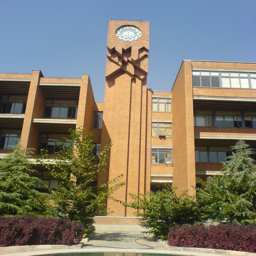

In [95]:
first_img

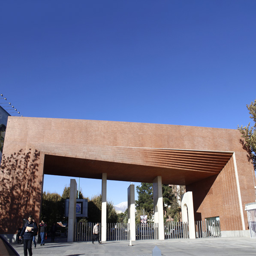

In [96]:
second_img

Convolutions have some interesting usages in image processing. For example, you can extract edges from an image by applying a convolution with a kernel that detects edges. Or you can convolve a specific kernel with your image to make it grayscale or blurred! Look at the definitions below:

__Edge Detection Kernel__:

_Sobel_ is one of the most famous edge detection kernels. It has two kernels, one for detecting vertical edges and the other for horizontal edges. You can see the kernels below:
$$
\text{Sobel}_x = \begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

$$
\text{Sobel}_y = \begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$


__Grayscale Kernel__:

You can simply convolve the image with the following kernel to make it grayscale:

$$
\text{Grayscale\_across\_R} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.3 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_G} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.6 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_B} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.1 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

(Convolve each kernel with its corresponding channel)

__Blurring Kernel__:

One of the famous kernels to blur an image is _Gaussian Blur_. You can see the kernel below:

$$
\text{Gaussian\_Blur} = \frac{1}{16} \times \begin{bmatrix}
1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1
\end{bmatrix}
$$


In [97]:
sobel_x = np.array([[-1, -2, -1],
                    [ 0,  0,  0],
                    [ 1,  2,  1]])

sobel_y = np.array([[-1, 0, 1],
                    [-2, 0, 2],
                    [-1, 0, 1]])

grayscale_r = np.array([[0, 0, 0],
                        [0, 0.3, 0],
                        [0, 0, 0]])

grayscale_g = np.array([[0, 0, 0],
                        [0, 0.6, 0],
                        [0, 0, 0]])

grayscale_b = np.array([[0, 0, 0],
                        [0, 0.1, 0],
                        [0, 0, 0]])

gaussian_blur = (1/16) * np.array([[1, 2, 1],
                                   [2, 4, 2],
                                   [1, 2, 1]])

img_size = 256

x = np.zeros((2, 3, img_size, img_size))
x[0] = np.array(first_img).transpose(2, 0, 1) / 255.0
x[1] = np.array(second_img).transpose(2, 0, 1) / 255.0
# x[0] = np.array(first_img).transpose(2, 0, 1)
# x[1] = np.array(second_img).transpose(2, 0, 1)

w = np.zeros((4, 3, 3, 3))
w[0, 0, :, :] = grayscale_r
w[0, 1, :, :] = grayscale_g
w[0, 2, :, :] = grayscale_b
w[1, 0, :, :] = sobel_x
w[1, 1, :, :] = sobel_x
w[1, 2, :, :] = sobel_x
w[2, 0, :, :] = sobel_y
w[2, 1, :, :] = sobel_y
w[2, 2, :, :] = sobel_y
w[3, 0, :, :] = gaussian_blur
w[3, 1, :, :] = gaussian_blur
w[3, 2, :, :] = gaussian_blur

b = np.array([0, 128, 128, 0])
# b = np.array([0, 0, 0, 0])

conv = MyConv(stride=1, padding=1)
out = conv.forward(x, w, b)

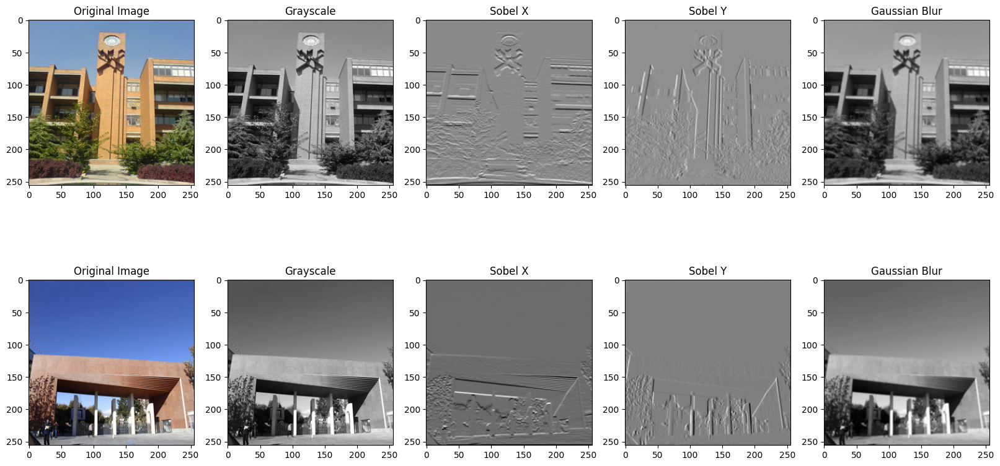

In [98]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 5, figsize=(20, 10))

for i in range(2):
    axes[i, 0].imshow(x[i].transpose(1, 2, 0))
    axes[i, 0].set_title('Original Image')
    axes[i, 1].imshow(out[i, 0], cmap='gray')
    axes[i, 1].set_title('Grayscale')
    axes[i, 2].imshow(out[i, 1], cmap='gray')
    axes[i, 2].set_title('Sobel X')
    axes[i, 3].imshow(out[i, 2], cmap='gray')
    axes[i, 3].set_title('Sobel Y')
    axes[i, 4].imshow(out[i, 3], cmap='gray')
    axes[i, 4].set_title('Gaussian Blur')

plt.show()

Now that we understood how Convolution works, we proceed further to use it in our models to perform a desired and specific task! We can use PyTorch's `Conv2D` layer from now on, because we understood how Convolutions work, behind the scene!

## Section 2: Neural Style Transfer (90 points)

In this part, we are going to implement a famous technique in the field of _Computer Vision_ called __Neural Style Transfer__. This technique is used to apply the style of a specific image to another image. For example, you can apply the style of a famous painting to your photo! Let's get started!

### 2.1 - Importing Libraries

In [99]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights
import torchvision.models as models

import copy

In [100]:
device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available() else "cpu"
)
torch.set_default_device(device)
device

device(type='cuda')

### 2.2 - Loading Images and doing some Preprocessing (5/90 pts)

In this part, you should load the content and style images and preprocess them. Preprocessing includes resizing the images to a specific size, normalizing them, and converting them to PyTorch tensors. You can use `torchvision.transforms` to do these tasks.

In [101]:
img_size = 512 if not device == "cpu" else 256

loader = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.Resize(img_size),
    transforms.ToTensor()],)
    #normalizing later

In [102]:
style_image_path = "./Images/Neural_Transfer/style.jpeg"
content_image_path = "./Images/Neural_Transfer/Content.jpeg"

def image_loader(image_name):
    image = Image.open(image_name)
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)


style_image = image_loader(style_image_path)
content_image = image_loader(content_image_path)

style_image.size(), content_image.size()

(torch.Size([1, 3, 512, 512]), torch.Size([1, 3, 512, 512]))

Here, you should implement a helper function to show you images (which are now in form of pytorch tensors) in the notebook. You can use `torchvision.transforms.ToPILImage` to convert a tensor to a PIL image.

In [103]:
unloader = transforms.ToPILImage()

plt.ion()

def imshow(tensor, title=None):
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

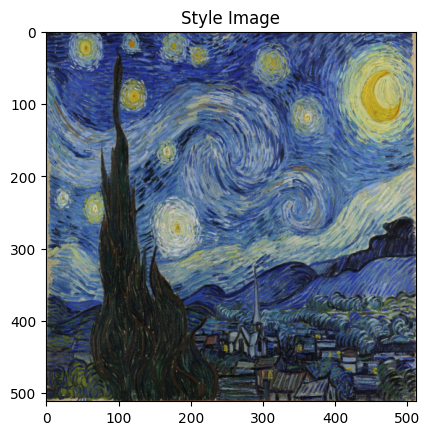

In [104]:
plt.figure()
imshow(style_image, "Style Image")

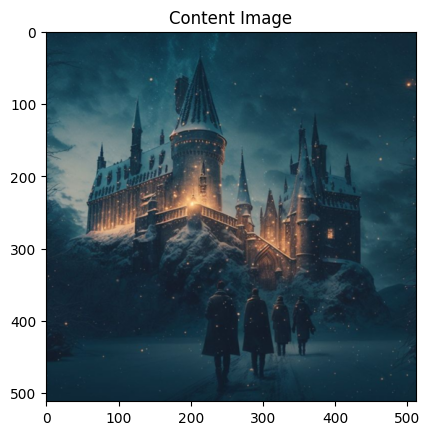

In [105]:
plt.figure()
imshow(content_image, "Content Image")

### 2.2 - VGG19 Model (15/90 pts)

One of the important parts of Neural Style Transfer is to use a pre-trained model to extract features from the content and style images. Here, we are going to use a pre-trained VGG19 model to extract features from the images. You can use `torchvision.models.vgg19` to load the model. You should also freeze the weights of the model to prevent them from updating during the optimization process.

<div style="text-align:center;">
  <img src="./Images/VGG-19.png" />
</div>

But what is VGG model? Let's see with a simple experiment:

In [106]:
import certifi
import os

os.environ['SSL_CERT_FILE'] = certifi.where()

Here, please load `VGG19` model from `torchvision.models` and see the architecture of the model. You may need models `features` and `classifier` part stored seperately as we will discuss these both parts.

In [107]:
vgg_model = vgg19(weights=VGG19_Weights.DEFAULT)
vgg_model_features = vgg_model.features
vgg_model_classifier = vgg_model.classifier

In [108]:
import torchsummary

for param in vgg_model.parameters():
    param.requires_grad = False

torchsummary.summary(vgg_model, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 224, 224]           1,792
              ReLU-2         [-1, 64, 224, 224]               0
            Conv2d-3         [-1, 64, 224, 224]          36,928
              ReLU-4         [-1, 64, 224, 224]               0
         MaxPool2d-5         [-1, 64, 112, 112]               0
            Conv2d-6        [-1, 128, 112, 112]          73,856
              ReLU-7        [-1, 128, 112, 112]               0
            Conv2d-8        [-1, 128, 112, 112]         147,584
              ReLU-9        [-1, 128, 112, 112]               0
        MaxPool2d-10          [-1, 128, 56, 56]               0
           Conv2d-11          [-1, 256, 56, 56]         295,168
             ReLU-12          [-1, 256, 56, 56]               0
           Conv2d-13          [-1, 256, 56, 56]         590,080
             ReLU-14          [-1, 256,

Please briefly explain what is a VGG model used for and what does each `features` and `classifier` part, represent?

**Your Answer:**

The VGG model, specifically VGG16 and VGG19, is  used in different computer vision tasks due to its powerful feature extraction capabilities and straightforward architecture. Some of the primary uses:
Image Classification:It achieved high performance on the ImageNet dataset, which consists of millions of images across 1000 categories.
Feature Extraction: Because of its deep convolutional layers, the VGG model can can be used as a feature extractor. The intermediate layers of the VGG model can capture various levels of abstraction, from low-level features like edges and textures to high-level features like shapes and objects.
Transfer Learning: In transfer learning, a pre-trained model (such as VGG) is used as a starting point for a different but related task. The VGG model, pre-trained on a large dataset like ImageNet, can be fine-tuned for specific tasks with smaller datasets.
Object Detection: VGG features can be used in object detection frameworks such as Faster R-CNN and YOLO.
Neural Style Transfer: VGG models are often used in neural style transfer, where the objective is to apply the artistic style of one image to the content of another. Thas's what we are doing here.

Features (Convolutional Layers): This part of the model extracts features from the input image using a series of convolutional and pooling layers. Each convolutional layer applies a set of filters to the input image to create feature maps, which capture various patterns and features such as edges, textures, and shapes. The ReLU activation function has non-linearity to help the model learn complex patterns. Also MaxPool2d reduces the spatial dimensions of the feature maps, helping to reduce computational complexity.

Classifier (Fully Connected Layers)
This part of the model takes the extracted features and performs classification. The fully connected layers are responsible for mapping the high-level features to the final output classes.
Linear: Fully connected layer that combines all the features from the previous layer.
ReLU: Activation function that adds non-linearity.
Dropout: Regularization technique that randomly sets a fraction of the input units to zero during training, helping to prevent overfitting.

Now, we are going to give a sample image `Images/Neural_Transfer/Car.jpeg` to the model, see the output for classification and also visualize the feature maps (outputs of each convolutional layer) to see what's going on!

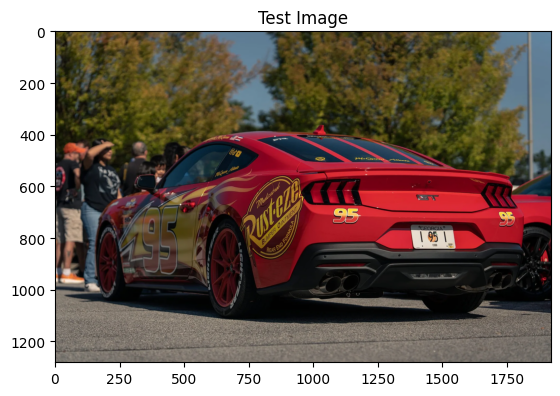

In [109]:
vgg_test_image = Image.open("./Images/Neural_Transfer/Car.jpeg")

plt.figure()
plt.imshow(vgg_test_image)
plt.title("Test Image")
plt.show()

preprocess_vgg = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

input_tensor = preprocess_vgg(vgg_test_image)
input_batch = input_tensor.unsqueeze(0).to(device)

vgg_model = vgg_model.to(device)
with torch.no_grad():
    output = vgg_model(input_batch)

_, predicted = torch.max(output, 1)

As you can see, the output of the classifier is an integer. This integer is actually the **class number** in _Image Net_ dataset. Let's get the name of the class:

In [110]:
import requests

class_idx = requests.get(
    "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
).json()

# Get the class name
class_name = class_idx[predicted.item()]

print(f"Predicted class: {class_name}")

Predicted class: sports car


Now that we understood the architecture of VGG, and also the output of its classifier, it's time to extract features from the images! And see what's going on in the feature maps!

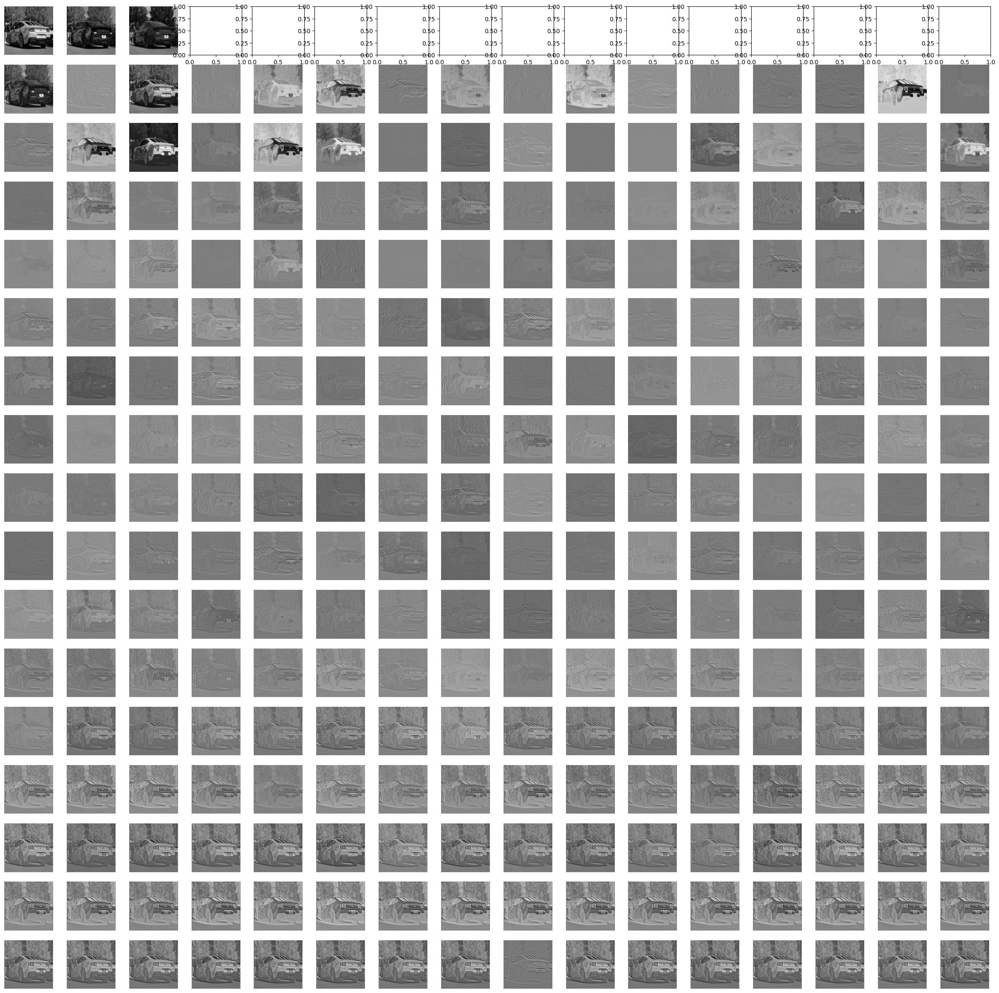

In [111]:
def visualize_feature_maps(model, input_image):
    layers = [layer for layer in model.children() if isinstance(layer, nn.Conv2d)]
    results = [input_image]

    for i, layer in enumerate(layers):
        input_image = layer(input_image)
        results.append(input_image)

        if len(results) > 16:
            break

    fig, axes = plt.subplots(len(results), 16, figsize=(30, 30))
    for i, result in enumerate(results):
        for j in range(16):
            if j >= result.size(1):
                break
            feature_map = result[0, j].cpu().detach().numpy()
            axes[i, j].imshow(feature_map, cmap='gray')
            axes[i, j].axis('off')
    plt.show()

input_image = preprocess_vgg(vgg_test_image).unsqueeze(0).to(device)
visualize_feature_maps(vgg_model_features, input_image)

It's fun too look under the hood, isn't it? As you can see, we can guess what are the learned features in each layer if the network (at least in the first layers). For example, in the first layer, the network learns to detect edges, and in the second layer, it learns to detect simple shapes. In the deeper layers, the network learns to detect more complex features.

### 2.3 - Content and Style Loss (15/90 pts)

In order to learn the correct image and keep the content of the original image while applying the style of the seconf image, we need 2 losses: 1. Content Loss and 2. Style Loss. Let's delve into each one!

**Content Loss** is responsible for keeping the content of the original image. It is calculated as the mean squared error between the feature maps of the original image and the generated image.

In [112]:
class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input

**Style Loss** is responsible for applying the style of the second image to the generated image. It is calculated as the mean squared error between the Gram matrices of the feature maps of the second image and the generated image.

In [113]:
def gram_matrix(input):
    a, b, c, d = input.size()
    features = input.view(a * b, c * d)
    G = torch.mm(features, features.t())
    return G.div(a * b * c * d)

In [114]:
class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input

Now, we use `features` part of the VGG model to extract features from the content and style images. Then, we calculate the content and style loss using the extracted features.

In [115]:
cnn = models.vgg19(pretrained=True).features.to(device).eval()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [116]:
# cnn_normalization_mean = torch.tensor(
#     [0.485, 0.456, 0.406]
# )  # Normalization mean for the VGG19 model
# cnn_normalization_std = torch.tensor(
#     [0.229, 0.224, 0.225]
# )  # Normalization std for the VGG19 model
cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        return (img - self.mean) / self.std

Please note that after which layers you should calculate the content loss and after which ones, you should calculate the style loss. Use the layer names you saw earlier in the `torchsummary` output for VGG19 model.

In [117]:
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_normalization_module(normalization_mean, normalization_std):
    normalization = Normalization(normalization_mean, normalization_std).to(device)
    return normalization

def add_layers_to_model(cnn, model, content_img, style_img, content_layers, style_layers, content_losses, style_losses):
    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)
    return model

def construct_final_model(model):
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break
    model = model[:(i + 1)]
    return model

def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    cnn = copy.deepcopy(cnn)

    normalization = get_normalization_module(normalization_mean, normalization_std)

    content_losses = []
    style_losses = []

    model = nn.Sequential(normalization)

    model = add_layers_to_model(cnn, model, content_img, style_img, content_layers, style_layers, content_losses, style_losses)

    model = construct_final_model(model)

    return model, style_losses, content_losses

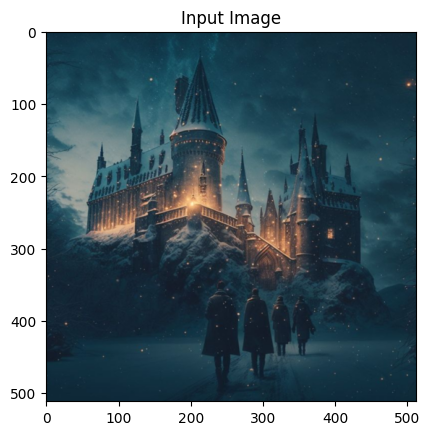

In [118]:
input_img = content_image.clone()
plt.figure()
imshow(input_img, title='Input Image')

(15/90 pts) Now, we need to define our optimizer. We use `LBFGS` optimizer. Let's get familiar with this optimizer a little bit:

Let's use this optimizer to optimize a simple function $f(x) = x^2$. We want to find the minimum of this function using `LBFGS` optimizer. First, you should initialize a tensor $x$ with a random value. Then, you should define a closure function that calculates the value of the function and its gradient. Finally, you should use the `step` method of the optimizer to update the value of $x$.

And lastly, you should generate an animation using `matplotlib.animation` to show how the value of $x$ changes during optimization.

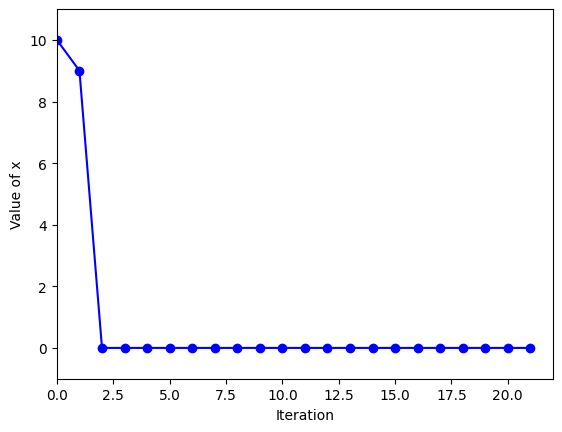

In [119]:
import matplotlib.animation as animation
from torch.optim import LBFGS
import IPython.display as display
import numpy as np
from IPython.display import HTML

def get_input_optimizer(input_img):
    optimizer = optim.LBFGS([input_img.requires_grad_()])
    return optimizer

###################################
def f(x):
    return x ** 2

x = torch.tensor([10.0], requires_grad=True)

optimizer = optim.LBFGS([x])
x_values = []

def closure():
    optimizer.zero_grad()
    loss = f(x)
    loss.backward()
    x_values.append(x.item())
    return loss

for i in range(20):
    optimizer.step(closure)

fig, ax = plt.subplots()
line, = ax.plot([], [], 'bo-', animated=True)
ax.set_xlim(0, len(x_values))
ax.set_ylim(min(x_values) - 1, max(x_values) + 1)
ax.set_xlabel('Iteration')
ax.set_ylabel('Value of x')

def init():
    line.set_data([], [])
    return line,

def update(frame):
    line.set_data(range(frame+1), x_values[:frame+1])
    return line,

ani = animation.FuncAnimation(fig, update, frames=len(x_values), init_func=init, blit=True, repeat=False)

ani.save('./Images/optimization_animation.mp4', writer='ffmpeg', fps=2)
plt.show()

(35/90 pts) Now, let's use this optimizer to optimize our `input_image` to minimize the content and style loss. You should define a closure function that calculates the content and style loss and their gradients. Then, you should use the `step` method of the optimizer to update the value of the `input_image`. Please also **note** that you should use a weighted sum of the content and style loss to optimize the input image. (weight of each loss is a hyperparameter)

In [125]:
def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=500,
                       style_weight=1000000, content_weight=1):
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)
    optimizer = get_input_optimizer(input_img)

    run = [0]
    style_loss_history = []
    content_loss_history = []
    total_loss_history = []

    input_img, style_loss_history, content_loss_history, total_loss_history = optimize_image(
        model, style_losses, content_losses, optimizer, input_img, run, num_steps, style_weight, content_weight,
        style_loss_history, content_loss_history, total_loss_history)

    input_img.data.clamp_(0, 1)
    return input_img, style_loss_history, content_loss_history, total_loss_history

def optimize_image(model, style_losses, content_losses, optimizer, input_img, run, num_steps, style_weight, content_weight,
                   style_loss_history, content_loss_history, total_loss_history):
    while run[0] <= num_steps:
        def closure():
            input_img.data.clamp_(0, 1)
            optimizer.zero_grad()
            model(input_img)
            style_score, content_score = calculate_losses(style_losses, content_losses, style_weight, content_weight)

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score.item()))
                print()
                plt.figure()
                imshow(input_img, title='Image')

            style_loss_history.append(style_score.item())
            content_loss_history.append(content_score.item())
            total_loss_history.append(loss.item())

            return style_score + content_score

        optimizer.step(closure)
    return input_img, style_loss_history, content_loss_history, total_loss_history

def calculate_losses(style_losses, content_losses, style_weight, content_weight):
    style_score = 0
    content_score = 0

    for sl in style_losses:
        style_score += sl.loss
    for cl in content_losses:
        content_score += cl.loss

    style_score *= style_weight
    content_score *= content_weight

    return style_score, content_score


Now, let's see the result of optimization process on our `input_image`.

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Current working directory: /content/drive/MyDrive/ML Project/Project
cuda
Picture's size: torch.Size([1, 3, 512, 512])
torch.Size([1, 3, 512, 512])


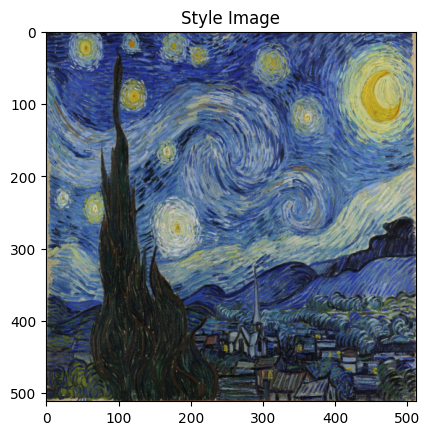

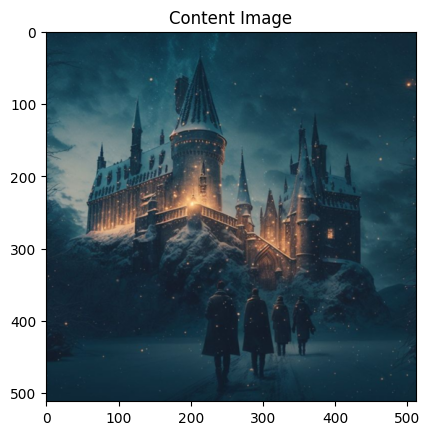

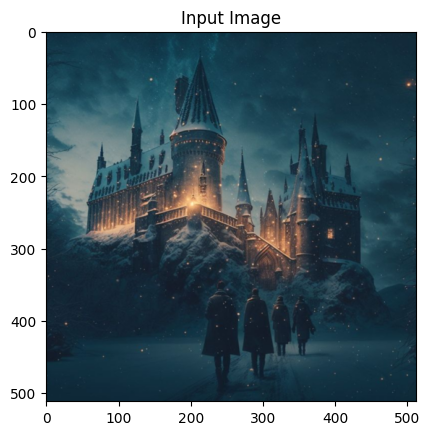

run [50]:
Style Loss : 35.871056 Content Loss: 26.736378



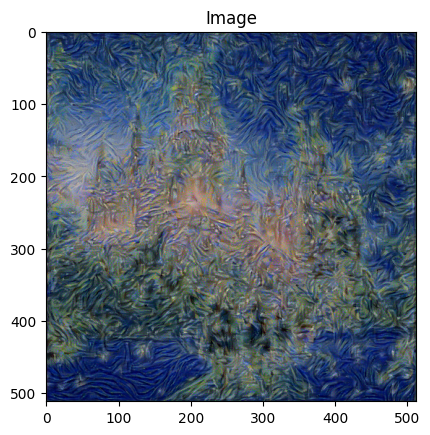

run [100]:
Style Loss : 8.304230 Content Loss: 23.582932



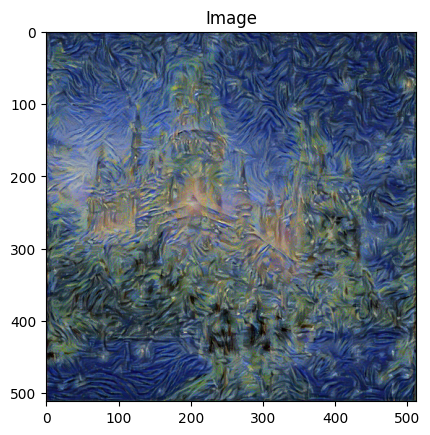

run [150]:
Style Loss : 4.334792 Content Loss: 20.166014



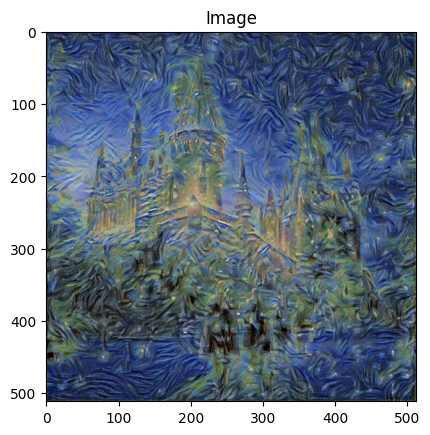

run [200]:
Style Loss : 3.049500 Content Loss: 17.858995



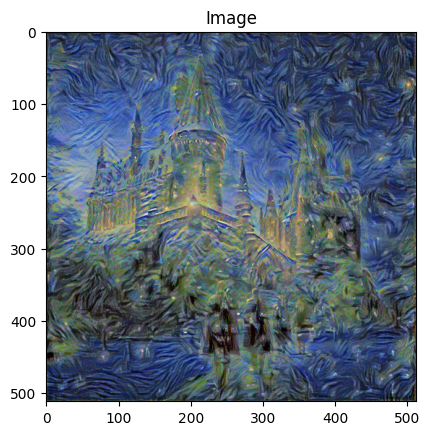

run [250]:
Style Loss : 2.343647 Content Loss: 16.189564



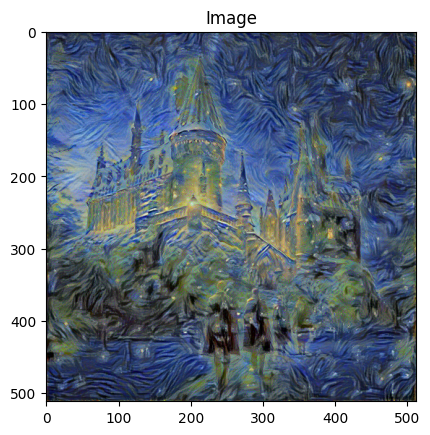

run [300]:
Style Loss : 1.852383 Content Loss: 14.912901



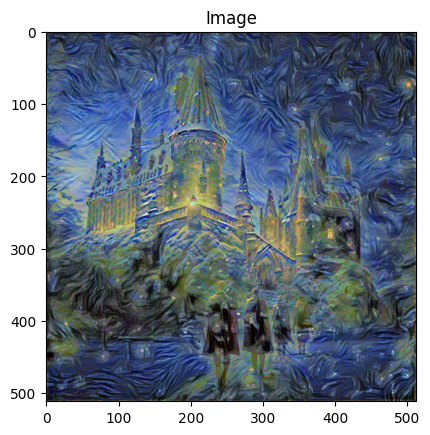

run [350]:
Style Loss : 1.451599 Content Loss: 13.918306



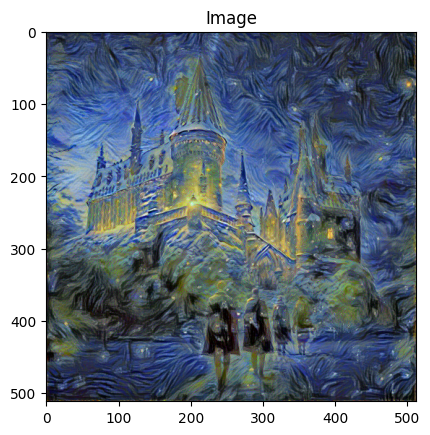

run [400]:
Style Loss : 1.154118 Content Loss: 13.228115



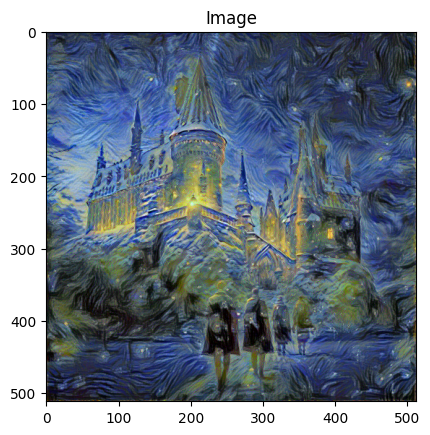

run [450]:
Style Loss : 0.952575 Content Loss: 12.658924



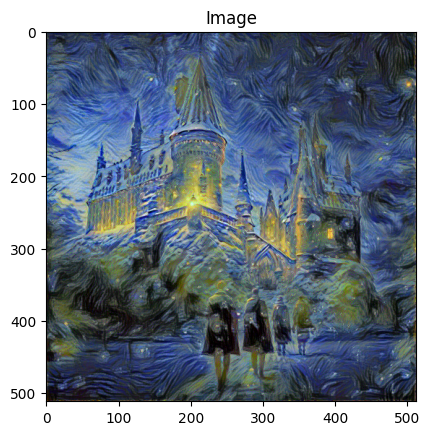

run [500]:
Style Loss : 0.832983 Content Loss: 12.220104



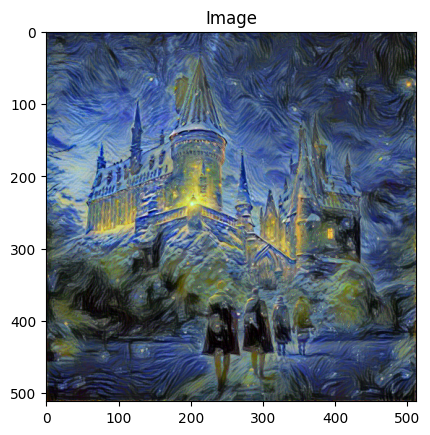

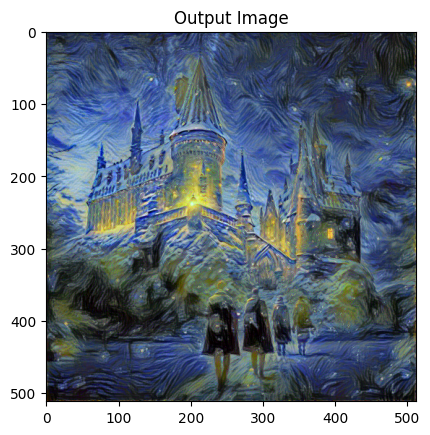

In [126]:
from google.colab import drive
import os
drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/ML Project/Project/')

print("Current working directory:", os.getcwd())
print(device)

imsize = 512 if torch.cuda.is_available() else 128

loader = transforms.Compose([
    transforms.Resize((imsize,imsize)),
    transforms.ToTensor()])

def image_loader(image_name):
    image = Image.open(image_name)
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)

style_img = image_loader("./Images/Neural_Transfer/style.jpeg")
content_img = image_loader("./Images/Neural_Transfer/Content.jpeg")

print("Picture's size:",style_img.size())
print(content_img.size())
assert style_img.size() == content_img.size(), \
    "we need to import style and content images of the same size"
unloader = transforms.ToPILImage()

plt.ion()

def imshow(tensor, title=None):
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)


plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

input_img = content_img.clone()
plt.figure()
imshow(input_img, title='Input Image')

output, style_loss_history, content_loss_history, total_loss_history = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img)

plt.figure()
imshow(output, title='Output Image')

plt.ioff()
plt.show()

(5/90 pts) Also, let's plot our `style_losses`, `content_losses` and `total_losses` to see how they change during the optimization process.

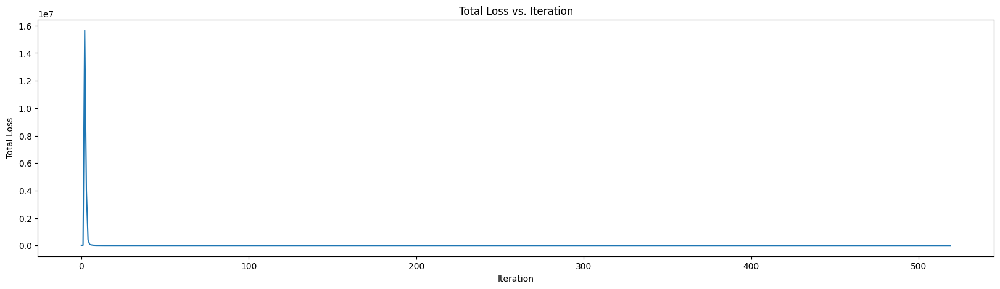

In [127]:
plt.figure(figsize=(20, 5))
plt.plot(total_loss_history)
plt.xlabel('Iteration')
plt.ylabel('Total Loss')
plt.title('Total Loss vs. Iteration')
plt.ioff()
plt.show()

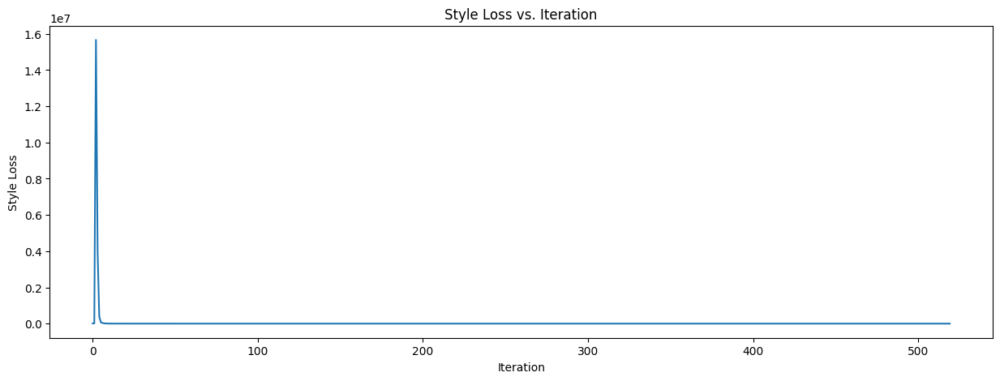

In [128]:
plt.figure(figsize=(15, 5))
plt.plot(style_loss_history)
plt.xlabel('Iteration')
plt.ylabel('Style Loss')
plt.title('Style Loss vs. Iteration')
plt.ioff()
plt.show()

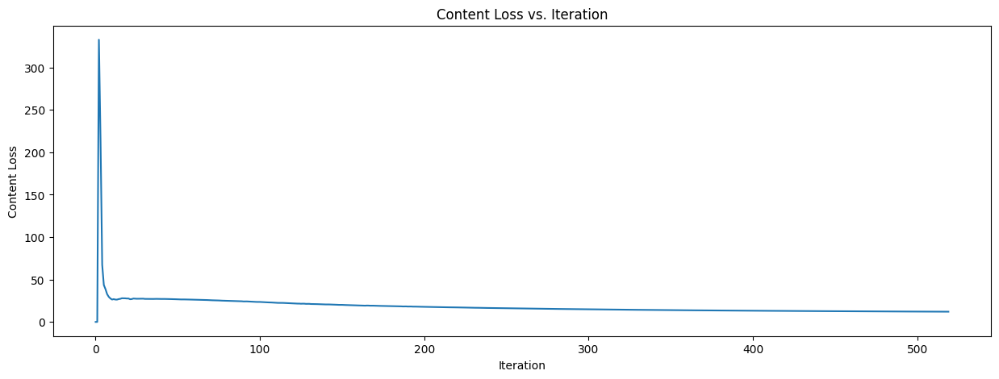

In [129]:
plt.figure(figsize=(15, 5))
plt.plot(content_loss_history)
plt.xlabel('Iteration')
plt.ylabel('Content Loss')
plt.title('Content Loss vs. Iteration')
plt.ioff()
plt.show()